<img src="https://user-images.githubusercontent.com/91726340/223084103-c04326c3-f9cc-437d-8a85-abb0865400ec.png" alt="Image 1" style="float:left; margin-right:8px;" width="800"/>
<img src="https://cdni.autocarindia.com/Utils/ImageResizer.ashx?n=https://cdni.autocarindia.com/ExtraImages/20221018052856_Spectre_2.jpg&w=700&q=90&c=1" alt="Image 1" style="float:right; margin-right:8px;" width="500"/>
<img src="https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRLFbgHNLgDZj9XNbQUrwat3qKuGqrU4o__Jv2eJ1naGDUbrACAooA5smrkvgY3rlQGs-w&usqp=CAU" alt="Image 1" style="float:right; margin-right:8px;" width="500"/>
<img src="https://cdn.motor1.com/images/mgl/bgYjwj/s1/rolls-royce-spectre-hot-weather-testing-9.webp
" alt="Image 1" style="float:right; margin-right:5px;" width="200"/>


# Karan Soni

# Project Summery :

#### In this project, we embarked on the journey of predicting car prices using Machine Learning techniques. The project can be summarized into the following key points:

#### Data Understanding: We started by gaining a basic understanding of the dataset, which consisted of various features related to cars.

#### Data Cleaning: To ensure the data's quality, we performed data cleaning to handle missing values and anomalies. This step was crucial in making the data suitable for analysis.

#### Exploratory Data Analysis (EDA): EDA provided valuable insights into the dataset. We visualized the data, identified trends, and explored relationships between features and the target variable.

#### Data Preprocessing: Before training our models, we preprocessed the data. This included encoding categorical variables, handling outliers, and scaling numeric features to prepare the dataset for machine learning algorithms.

#### Model Training: We trained various machine learning algorithms, including RandomForestRegressor and GradientBoostingRegressor, to predict car prices. Our models achieved impressive results, as demonstrated by their performance metrics.

#### Model Evaluation: We evaluated the models using key performance metrics, including R2 score, Mean Squared Error (MSE), and Root Mean Squared Error (RMSE), on both training and testing data. 

#### Model Comparison: We compared the performance of different algorithms, noting that GradientBoostingRegressor yielded exceptional results with an R2 score of 99.41 on the training data and 93.40 on the testing data. This highlights its ability to predict car prices effectively.

#### Business Approach: Moving beyond the technical aspects, we considered the business approach. Using our trained model, businesses can predict car prices accurately, allowing them to make informed decisions on pricing strategies, inventory management, and market competitiveness.


## Importing all required Dependencise 


In [305]:

import numpy as np 
import pandas as pd 
import warnings
import matplotlib.pyplot as plt
import seaborn as sns  
from sklearn.model_selection import train_test_split
from ydata_profiling import ProfileReport

from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from xgboost import XGBRegressor

from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

In [306]:
df = pd.read_csv('/kaggle/input/carprice/CarPrice.csv')
df.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [307]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

In [308]:
df.select_dtypes(include='object')

,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,enginetype,cylindernumber,fuelsystem
0,alfa-romero giulia,gas,std,two,convertible,rwd,front,dohc,four,mpfi
1,alfa-romero stelvio,gas,std,two,convertible,rwd,front,dohc,four,mpfi
2,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,ohcv,six,mpfi
3,audi 100 ls,gas,std,four,sedan,fwd,front,ohc,four,mpfi
4,audi 100ls,gas,std,four,sedan,4wd,front,ohc,five,mpfi
...,...,...,...,...,...,...,...,...,...,...
200,volvo 145e (sw),gas,std,four,sedan,rwd,front,ohc,four,mpfi
201,volvo 144ea,gas,turbo,four,sedan,rwd,front,ohc,four,mpfi
202,volvo 244dl,gas,std,four,sedan,rwd,front,ohcv,six,mpfi
203,volvo 246,diesel,turbo,four,sedan,rwd,front,ohc,six,idi


In [309]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## EDA Univariate Analysis

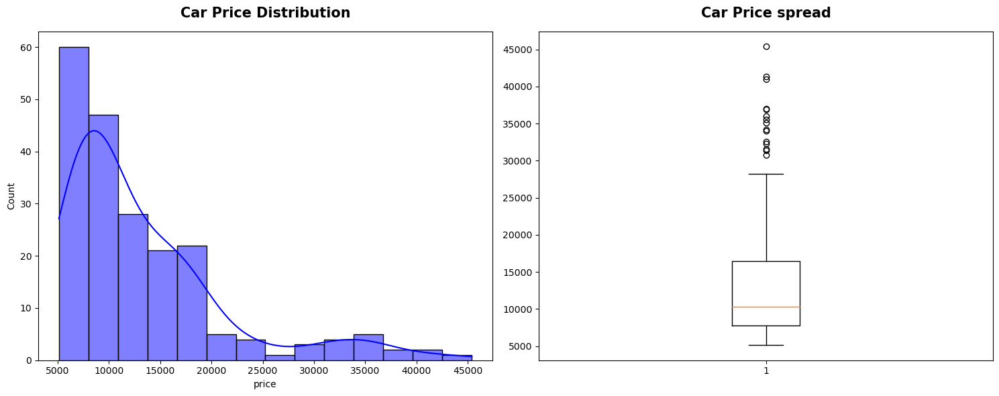

In [310]:

plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
sns.histplot(df['price'], color='blue', kde=True)
plt.title('Car Price Distribution', fontweight='black',pad=15, fontsize=15)

plt.subplot(1,2,2)
plt.boxplot(df['price'])
plt.title('Car Price spread', fontweight='black',pad=15, fontsize=15)
plt.tight_layout()
plt.show()


**Inference**
* The mean and median of the column are slighty different 
* Data has right skewed, mejority of car's are sold at the price range between 5000 to 10000 below 14000.
* It means the market share of car have a high number of buyers from middel class.

### Feature Enginerring 
* Feature Name - CarName 
* Reason - We are spliting the carname and car model for batter understanding about the cars, and its easy
* for us at the time of grouping also 
* Converiting two columns from one - CarName and CarBrand 

In [311]:
df['CarName'].values[0:10]

array(['alfa-romero giulia', 'alfa-romero stelvio',
       'alfa-romero Quadrifoglio', 'audi 100 ls', 'audi 100ls',
       'audi fox', 'audi 100ls', 'audi 5000', 'audi 4000',
       'audi 5000s (diesel)'], dtype=object)

In [312]:
df['CarBrand'] = df['CarName'].str.split(' ').str.get(0).str.upper()

In [313]:
len(set(df['CarBrand']))

27

In [314]:
print(sorted(df['CarBrand'].unique(),reverse=False))

['ALFA-ROMERO', 'AUDI', 'BMW', 'BUICK', 'CHEVROLET', 'DODGE', 'HONDA', 'ISUZU', 'JAGUAR', 'MAXDA', 'MAZDA', 'MERCURY', 'MITSUBISHI', 'NISSAN', 'PEUGEOT', 'PLYMOUTH', 'PORCSHCE', 'PORSCHE', 'RENAULT', 'SAAB', 'SUBARU', 'TOYOTA', 'TOYOUTA', 'VOKSWAGEN', 'VOLKSWAGEN', 'VOLVO', 'VW']


There seem to be some spelling error in the car brand name 
eg- 
* toyouta = toyota
* porcshce = porsche 
* maxda = mazda 
* VM, Vokswagen = Volkswagen 
* So we have to replace all the incorrect car name with correct name below 

In [315]:
df['CarBrand'] = df['CarBrand'].replace(['VW','VOKSWAGEN'],'VOLKSWAGEN')
df['CarBrand'] = df['CarBrand'].replace(['MAXDA'],'MAZDA')
df['CarBrand'] = df['CarBrand'].replace(['TOYOUTA'],'TOYOTA')
df['CarBrand'] = df['CarBrand'].replace(['PORCSHCE'],'PORSCHE')

In [316]:
len(set(df['CarBrand']))

22

In [317]:
df['CarBrand'].value_counts()
# toyota has the highest number of car model and mercury has the lowest number of carmodels 

TOYOTA         32
NISSAN         18
MAZDA          17
MITSUBISHI     13
HONDA          13
VOLKSWAGEN     12
SUBARU         12
PEUGEOT        11
VOLVO          11
DODGE           9
BUICK           8
BMW             8
AUDI            7
PLYMOUTH        7
SAAB            6
PORSCHE         5
ISUZU           4
JAGUAR          3
CHEVROLET       3
ALFA-ROMERO     3
RENAULT         2
MERCURY         1
Name: CarBrand, dtype: int64

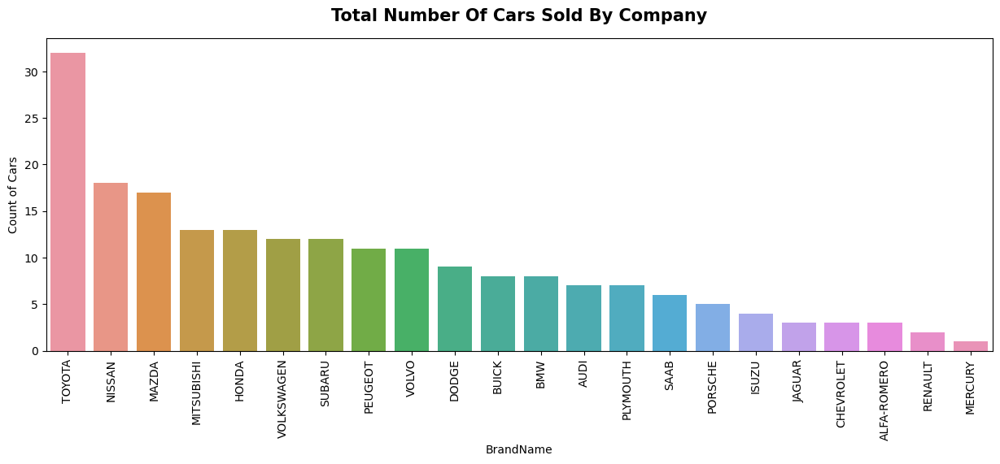

<Figure size 640x480 with 0 Axes>

In [318]:
# CountPlot for Car Brands with their count

fig, ax = plt.subplots(figsize = (15,5))
plt1 = sns.countplot(data=df, x=df['CarBrand'], order=pd.value_counts(df['CarBrand']).index,)
plt1.set(xlabel = 'BrandName', ylabel = 'Count of Cars')
plt1.set_xticklabels(plt1.get_xticklabels(), rotation=90)
plt.title('Total Number Of Cars Sold By Company', pad = 15, fontweight='black', fontsize=15)
plt.show()
plt.tight_layout()


* Above with the help of countplot and describtion we see that toyota has the most number of sales 
* We can also say that toyota is the kind of customers most favoured company 
* 1st - Toyota
* 2nd - Nissan
* 3rd - Mazda 
* last - 'Mercury'

In [319]:
df[df['CarBrand']=='TOYOTA'].iloc[0:2]

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,CarBrand
150,151,1,toyota corona mark ii,gas,std,two,hatchback,fwd,front,95.7,...,2bbl,3.05,3.03,9.0,62,4800,35,39,5348.0,TOYOTA
151,152,1,toyota corona,gas,std,two,hatchback,fwd,front,95.7,...,2bbl,3.05,3.03,9.0,62,4800,31,38,6338.0,TOYOTA


In [320]:
df[df['CarBrand']=="NISSAN"].iloc[0:2]

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,CarBrand
89,90,1,Nissan versa,gas,std,two,sedan,fwd,front,94.5,...,2bbl,3.15,3.29,9.4,69,5200,31,37,5499.0,NISSAN
90,91,1,nissan gt-r,diesel,std,two,sedan,fwd,front,94.5,...,idi,2.99,3.47,21.9,55,4800,45,50,7099.0,NISSAN


In [321]:
df[df['CarBrand']=="MERCURY"]

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,CarBrand
75,76,1,mercury cougar,gas,turbo,two,hatchback,rwd,front,102.7,...,mpfi,3.78,3.12,8.0,175,5000,19,24,16503.0,MERCURY


In [322]:
df.CarBrand.describe()


count        205
unique        22
top       TOYOTA
freq          32
Name: CarBrand, dtype: object

## Visualizing Car Companies Avg Price
* Now we compare the average price of each car brand with the help of bar plot where we get to know about the 
* overvalued and undervalued car's model and their respective brand

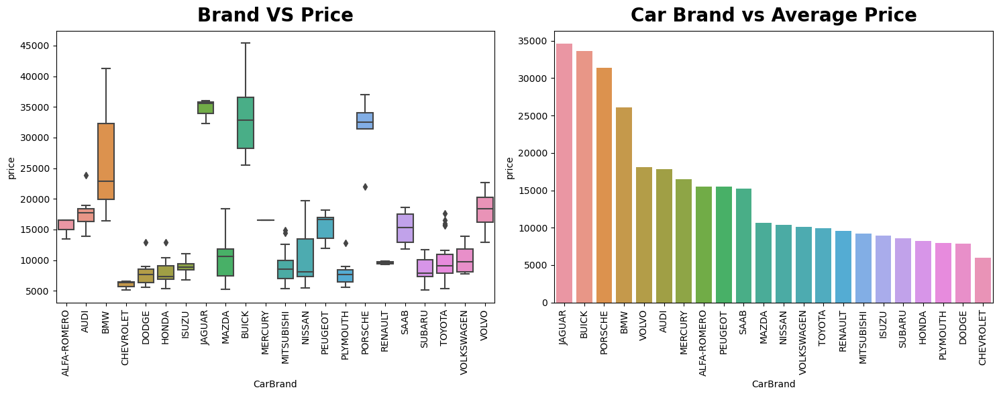

In [323]:
plt.figure(figsize=(15,6))

plt.subplot(1,2,1)
sns.boxplot(x= 'CarBrand', y='price', data=df)
plt.xticks(rotation=90)
plt.title('Brand VS Price', fontweight='black',pad=10, fontsize=20)


plt.subplot(1,2,2)
x=pd.DataFrame(df.groupby('CarBrand')['price'].mean().sort_values(ascending=False))
sns.barplot(x=x.index, y='price',data=x)
plt.xticks(rotation=90)
plt.title('Car Brand vs Average Price', fontweight='black',pad=10, fontsize=20)
plt.tight_layout()
plt.show()


* Insights
* JAGUAR ,BUICK AND PORSCHE HAS THE HIGHEST PRICE RANGE CAR 
* TOYOTA, NISSAN AND MAZDA ALL SET THEIR PRICE LOW IN COMPARISON TO OTHER CARS THAT IS THE REASON THEY HAVE THE HIGHEST SALES WITH PRICE ACTION.


* Visualizing Car Fueltype Feature 

here we have large number of categorical features and we have to visualize all of them so to reduce the timecost and work faster with efficient way we have to design a function which will help us to visualize faster.
### Visualizing features with catagorical Datatypes 
#### Major plots use for catagorical data = Boxplot, Countplot, barplot

In [324]:
import random


def Categorical_feature_insights(cols,df):
    plt.figure(figsize=(20,8))
      
    plt.subplot(1,3,1)
    sns.countplot(x=cols, data=df, order=df[cols].value_counts().index, palette='Set2')
    plt.title(f'{cols}Distribution', pad=10, fontweight='black', fontsize=20)
    plt.xticks(rotation=90)
    
    plt.subplot(1,3,2)
    sns.boxplot(x=cols, y='price', data=df, palette='Set2')
    plt.title(f'{cols}VS Price', pad=10, fontweight='black', fontsize=20)
    plt.xticks(rotation=90)
    
    plt.subplot(1,3,3)
    x=pd.DataFrame(df.groupby(cols)['price'].mean().sort_values(ascending=False))
    sns.barplot(x=x.index, y='price',data=x, palette='Set2')
    plt.title(f'{cols} VS Average Price', pad=10, fontweight='black', fontsize=20)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

    

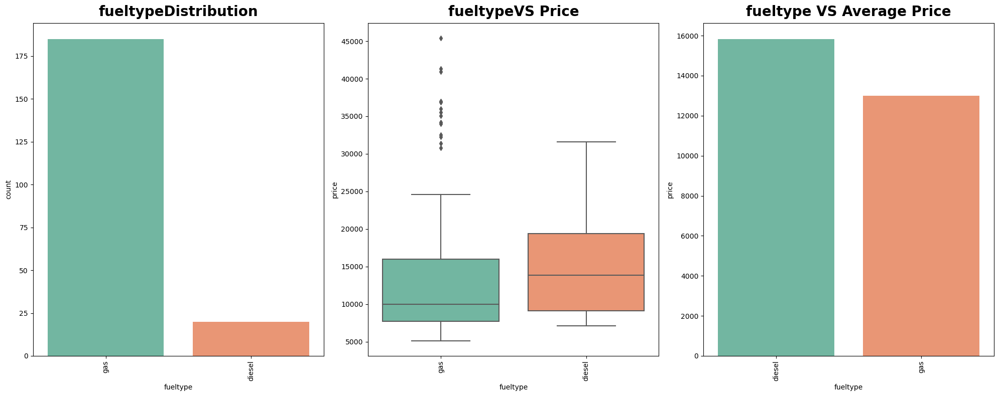

In [325]:
Categorical_feature_insights('fueltype',df)

* Insight 
* We can clearly state that with the first plot cars having the gas fuel types is mostly sold 
* Looking at the second plot we get the insight that gas fueltype car are avaliable in every price range.
* Lets go to 3rd plot we get the insight that even gas fueltype cars are mostly sold in the market but the when we compare the price the diseal fueltype cars are more costly then the gas fueltype cars.
* So with this insight we can make conclusion that Customer prefer those cars which consume less price in fuel.

* Visualizing aspiration Feature 

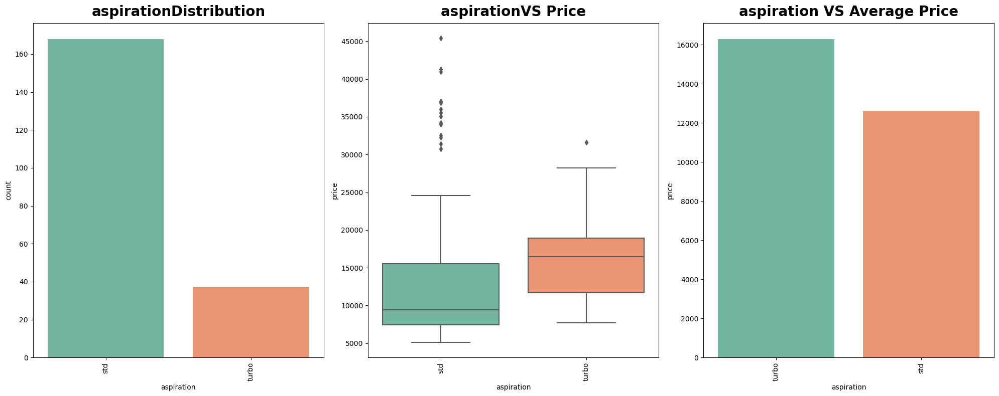

In [326]:
Categorical_feature_insights('aspiration',df)

* Insight 
* first Plot clearly shown that the STD aspiration is highly sold when compare to turbo aspiration
* second plot visualize the price range of both the categories and some car models having the std Aspiration are expensive too 
* third plot show that even std aspiration is more in demand and highly sold but still the price of turbo aspiration is higher.




* Visualizing Door Number Feature 

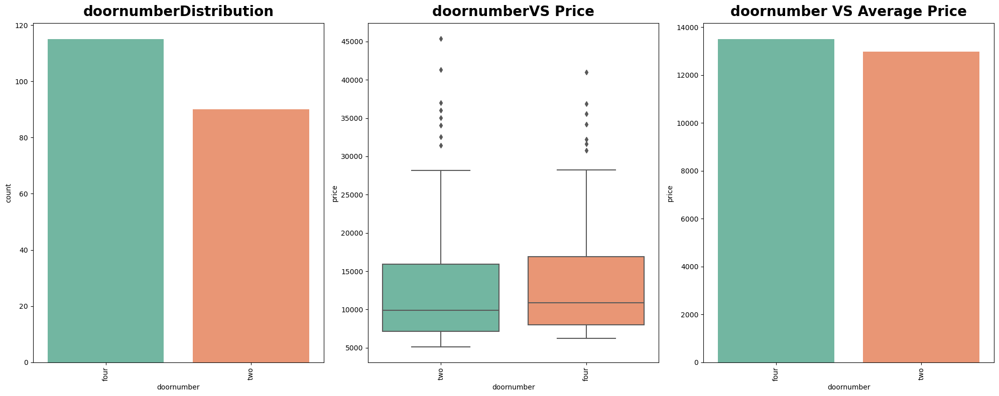

In [327]:
Categorical_feature_insights('doornumber',df)

* Observation and Insight 

* The market distribution are not having the big difference between both the doornumbers of car
* Even the avg price in both categories are also some 
* The number of Doors in the car dose not affect the price range of the car 

* Visualizing the Car Body Feature 

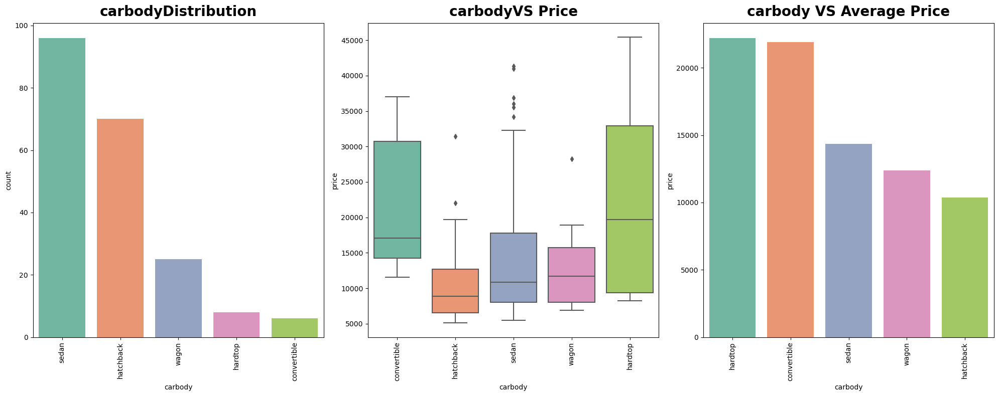

In [328]:
Categorical_feature_insights('carbody',df)

* Insight 
1. First Plot shown that car having sedan body type are the highest sold followed by hatchback 
2. hardtop bodytype cars have the highest price range followed by sendan and convertible 
* outlier in the sedan bodytype refer that some cars having sendan body type are costly 
3. The thirt plot shown that even the sedan has the highest sales but when comes to price comparison the hardtop and convertible has the highest avg price followed by the sedan.

* Visualizing the Enginelocation 

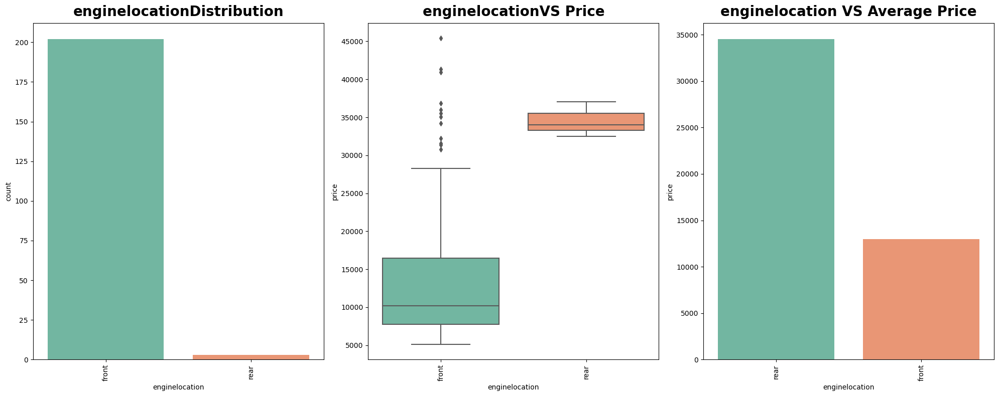

In [329]:
Categorical_feature_insights('enginelocation', df)

* Insight 
1. The 99 % cars have the Engine Location at the front 
* there are only 3 cars which have the engin location at rare 
2. Cars having the engine at the rear are very enpensive or the luxery segment car
3. So we can't make any inferance with this feature 

*Visualizing Engine type feature 

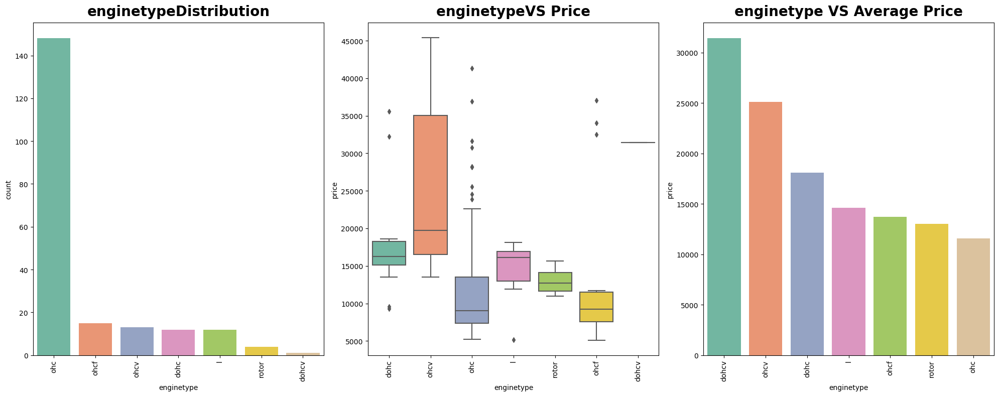

In [330]:
Categorical_feature_insights('enginetype',df)

* Insight
1. Cars having Ohc type engine are the mostly sold.
2. price range of Ohc type engine are also lower in comparison to other engine types.
3. Ohc type engine has the lowest price between all the engines.
4. When there are a majority class in any feture we can not make any deep or valuable insight because there are more baised decision.

* Visualizing Cylinder Number Feature 

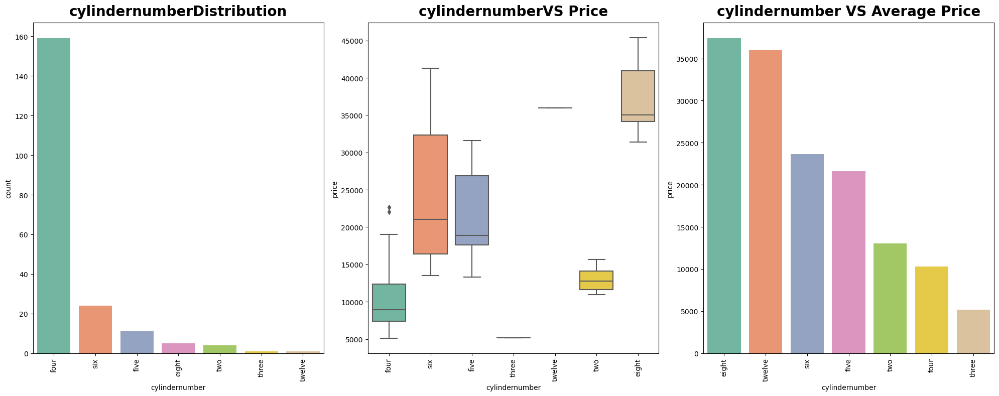

In [331]:
Categorical_feature_insights('cylindernumber',df)

* Insight 
1. The car having the four cylinder has the highest sales 
*Reason of higher sales 
* Fuel Efficiency  - 4 Cylinder engines tend to be more fuel efficient compared to larger engines with more cylinder 
* Lower operation cost - due to their smaller size and reduce fuel consumption , 4 cylinder engines often lead to lower operation cost 
* City Cummuting - for daily city cummuting and driving in traffic 4 cylinder are more then sufficient 

2. the price of four cylinder are lower compared to other cylinders 
3. the Avg price of eight cylinder are the most expensive followed by twelve and size cylinders 

* Visualizing Symboling feature

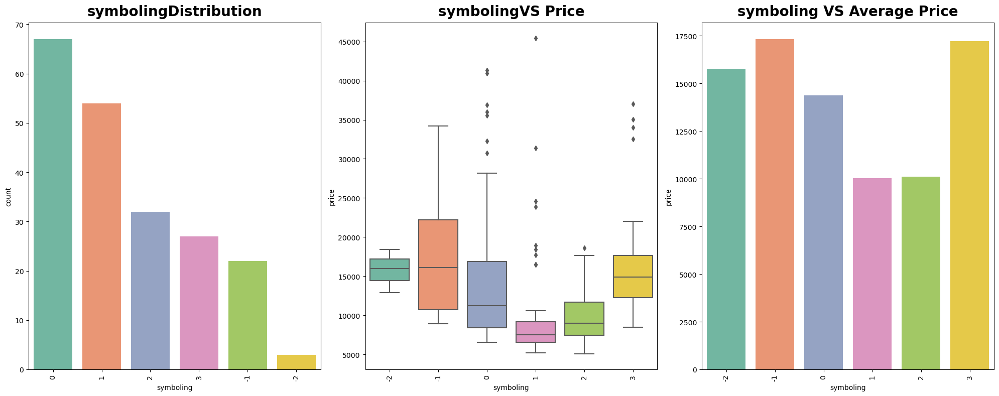

In [332]:
Categorical_feature_insights('symboling',df)

* Observation and Insights 

1. symboling represent the level of risk in the car with price 
2. The range of symboling is from -3 to +3 the negative value of symboling represt the higher risk and higher positive value represent the lower risk 

* Insight
* As we are clearly observing that the cars with symboling level 0 and 1 are mostly sold, they have the higher range cars 
* In the 3rd plot according to dataset the cars with negative values having the same avg price with the car who having the higher positive values.

## Now we are visualizing the features with numaric or float datatypes

In [333]:
# Here we also do the same , we create the fucntion to visualize the all the columns

def Binary_features_visualizition(cols):
    plt.figure(figsize=(15,6))
    x = 1
    for i in cols:
        plt.subplot(1,3,x)
        sns.scatterplot(x=i, y='price', data=df, color='red')
        plt.title(f'{i} vs Price', fontweight='black', fontsize=20, pad=10)
        plt.tight_layout()
        x += 1
  
    


/tmp/ipykernel_33/4266740802.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/tmp/ipykernel_33/4266740802.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


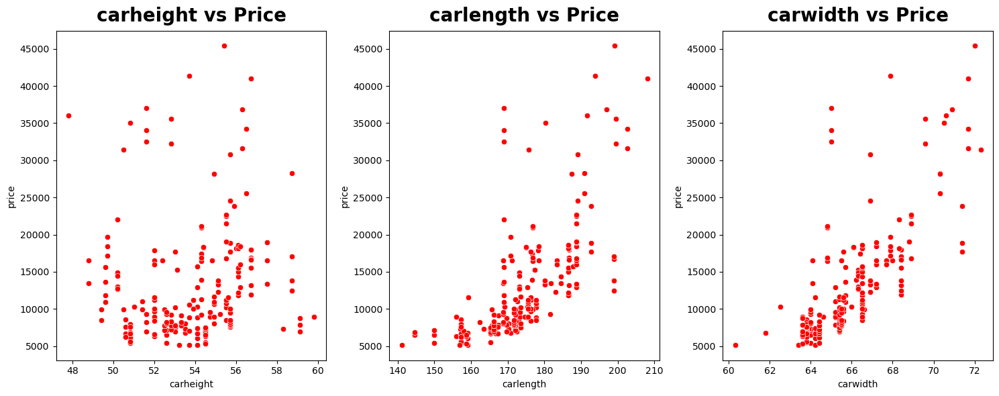

In [334]:
Binary_features_visualizition(['carheight','carlength','carwidth'])

* Insight 
* Here with the above plots we did not get more insight but we can say that:- 
    1. IF the length and width of the car has increse that directly shows the increse in the price of car. 
    2. Carlength feature are highly scatterd so we did not make any insight with this feature.
    
    
* Visualizing Stroke, Enginesize, Horsepower Feature

/tmp/ipykernel_33/4266740802.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()
/tmp/ipykernel_33/4266740802.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


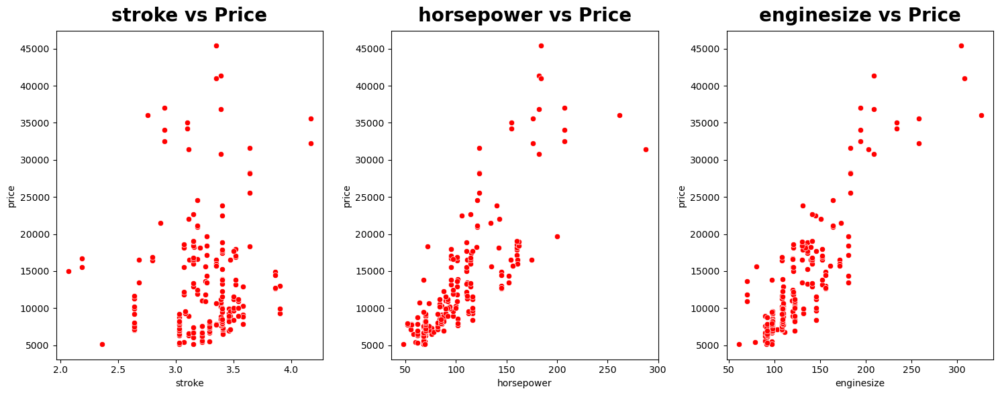

In [335]:
Binary_features_visualizition(['stroke', 'horsepower', 'enginesize'])

*Insights

1. The first plot tell us about the stroke coorelaion with price but due to heavely scatterness we can not make any stable decision with this feature although 
Stroke is directly coorelated with the enginsize because bigger the size of engine more the stroke in the engine

2. The Horsepower is directly coorelated with price becaue there are many peoples who loves the sports cars and faster cars so if we increse the horsepower
it directly affect the price and we see rise in the price 

3. Enginesize is also known as engine displacement, is the total volumne of all the engine cylinders, bigger the engine size result more power and torque, 
usually more torque is use in towing the heavy loads so increse the enginsize with increse the price also.


* Visualizing Car Mileage features
* Citympg and highwaympg

/tmp/ipykernel_33/4266740802.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


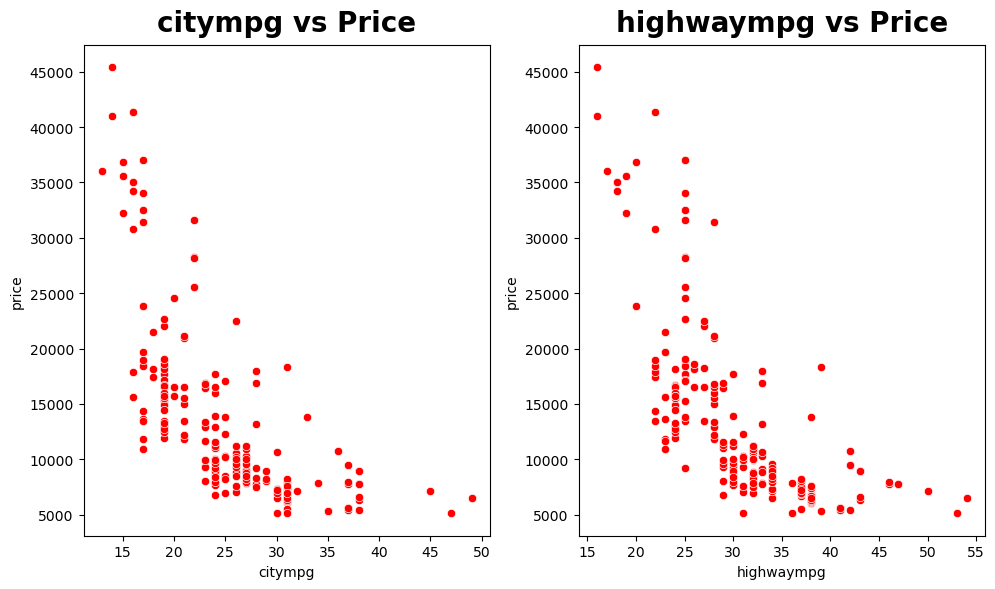

In [336]:
Binary_features_visualizition(['citympg','highwaympg'])

* Insights

* It is clearly shown in both the plots there are directly inverse coorelation with the price 
* Higher the mileage lower the price and lower the mileage higher the price 

/tmp/ipykernel_33/4266740802.py:10: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


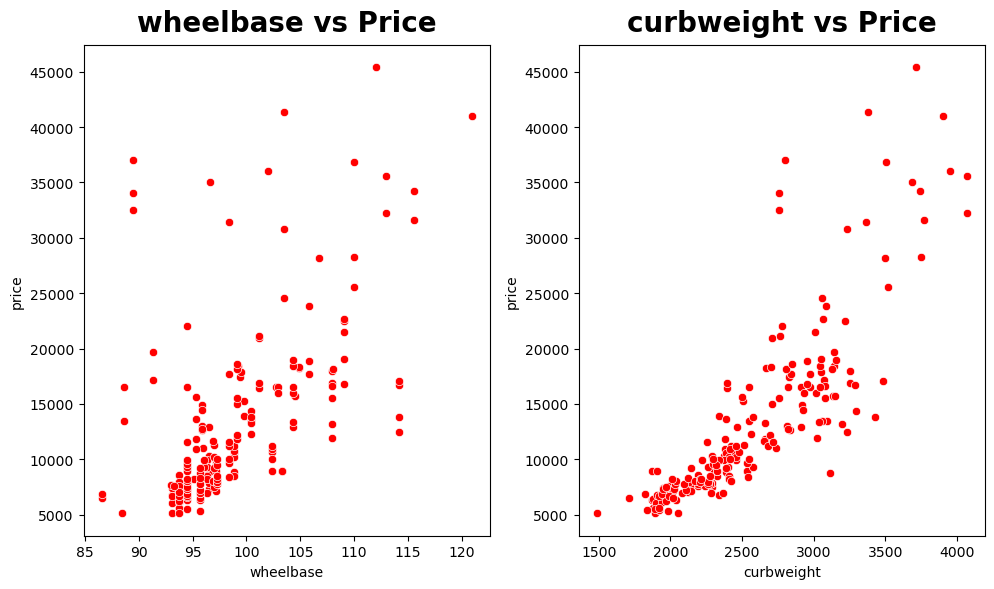

In [337]:
Binary_features_visualizition(['wheelbase', 'curbweight'])

* Insight 

1. Wheelbasae refer the the distance between the centers of the front and rear axles of the car
* It play the crucial role in car in car's handling 
* Cars with longer wheelbases may be considered more luxurious and comfortable, which can justify a higher price.

2. Curbweight : Curb weight represents the total weight of a car, including all standard equipment, fluids, and a full tank of fuel, but without any passengers
* Effect on Price: Curb weight can impact the price of a car in several ways:
* Performance: Heavier cars tend to have more substantial engines and better stability, which can contribute to improved acceleration and handling

### Data Preprocessing 

In [339]:
# Using label encoding on the dataset to convert all catagorical featues to numaric

new_df=df.copy()
new_df =  pd.get_dummies(catagorical_features)
new_df = pd.concat([new_df,numarical_features],axis=1)

In [340]:
new_df.head()

,CarName_Nissan versa,CarName_alfa-romero Quadrifoglio,CarName_alfa-romero giulia,CarName_alfa-romero stelvio,CarName_audi 100 ls,CarName_audi 100ls,CarName_audi 4000,CarName_audi 5000,CarName_audi 5000s (diesel),CarName_audi fox,...,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,mean
0,0,0,1,0,0,0,0,0,0,0,...,130,3.47,2.68,9.0,111,5000,21,27,13495.0,15498.33
1,0,0,0,1,0,0,0,0,0,0,...,130,3.47,2.68,9.0,111,5000,21,27,16500.0,15498.33
2,0,1,0,0,0,0,0,0,0,0,...,152,2.68,3.47,9.0,154,5000,19,26,16500.0,15498.33
3,0,0,0,0,1,0,0,0,0,0,...,109,3.19,3.40,10.0,102,5500,24,30,13950.0,17859.17
4,0,0,0,0,0,1,0,0,0,0,...,136,3.19,3.40,8.0,115,5500,18,22,17450.0,17859.17


In [341]:
numarical_features.columns

Index(['car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth',
       'carheight', 'curbweight', 'enginesize', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'price', 'mean'],
      dtype='object')

### Feature Scaling 

In [342]:
Scaler = StandardScaler()
num_cols = ['wheelbase','carlength','carwidth','curbweight','carheight','enginesize','boreratio','horsepower','compressionratio','stroke',
            'citympg','highwaympg','peakrpm','symboling']
new_df[num_cols] = Scaler.fit_transform(new_df[num_cols])
new_df.head()

,CarName_Nissan versa,CarName_alfa-romero Quadrifoglio,CarName_alfa-romero giulia,CarName_alfa-romero stelvio,CarName_audi 100 ls,CarName_audi 100ls,CarName_audi 4000,CarName_audi 5000,CarName_audi 5000s (diesel),CarName_audi fox,...,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price,mean
0,0,0,1,0,0,0,0,0,0,0,...,0.074449,0.519071,-1.839377,-0.288349,0.174483,-0.262960,-0.646553,-0.546059,13495.0,15498.33
1,0,0,0,1,0,0,0,0,0,0,...,0.074449,0.519071,-1.839377,-0.288349,0.174483,-0.262960,-0.646553,-0.546059,16500.0,15498.33
2,0,1,0,0,0,0,0,0,0,0,...,0.604046,-2.404880,0.685946,-0.288349,1.264536,-0.262960,-0.953012,-0.691627,16500.0,15498.33
3,0,0,0,0,1,0,0,0,0,0,...,-0.431076,-0.517266,0.462183,-0.035973,-0.053668,0.787855,-0.186865,-0.109354,13950.0,17859.17
4,0,0,0,0,0,1,0,0,0,0,...,0.218885,-0.517266,0.462183,-0.540725,0.275883,0.787855,-1.106241,-1.273900,17450.0,17859.17


In [343]:
new_df.drop(['mean'],axis=1, inplace=True)

In [344]:
# Spliting the dataset into X and Y for training and testing 
x = new_df.drop(['price'], axis=1)
y = new_df['price']

In [345]:
from sklearn.feature_selection import VarianceThreshold

feature_names = new_df.columns.tolist()

selector = VarianceThreshold(threshold=0.5)

# Fit the selector to your data
X_selected = selector.fit_transform(x)


In [346]:
# Get the indices of the selected features
selected_indices = selector.get_support(indices=True)

# Get the names of the selected features based on the indices
selected_feature_names = [feature_names[i] for i in selected_indices]

In [347]:
print(selected_feature_names)

['car_ID', 'symboling', 'wheelbase', 'carlength', 'carwidth', 'carheight', 'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg']


In [348]:
X_selected = new_df[selected_feature_names]
X_selected.head(5)

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg
0,1,1.743470,-1.690772,-0.426521,-0.844782,-2.020417,-0.014566,0.074449,0.519071,-1.839377,-0.288349,0.174483,-0.262960,-0.646553,-0.546059
1,2,1.743470,-1.690772,-0.426521,-0.844782,-2.020417,-0.014566,0.074449,0.519071,-1.839377,-0.288349,0.174483,-0.262960,-0.646553,-0.546059
2,3,0.133509,-0.708596,-0.231513,-0.190566,-0.543527,0.514882,0.604046,-2.404880,0.685946,-0.288349,1.264536,-0.262960,-0.953012,-0.691627
3,4,0.938490,0.173698,0.207256,0.136542,0.235942,-0.420797,-0.431076,-0.517266,0.462183,-0.035973,-0.053668,0.787855,-0.186865,-0.109354
4,5,0.938490,0.107110,0.207256,0.230001,0.235942,0.516807,0.218885,-0.517266,0.462183,-0.540725,0.275883,0.787855,-1.106241,-1.273900


In [349]:
x_train, x_test,y_train,y_test = train_test_split(X_selected,y,test_size=0.2, random_state=42)

In [350]:
print(x_train.shape)
y_train.shape

(164, 15)


(164,)

### Model Building 
* R2 score on training and testing 

In [351]:
training_score_R2 = []
testing_score_R2 = []
training_score_mse = []
testing_score_mse = []
training_score_rmse = []
testing_score_rmse = []

In [352]:
from sklearn.metrics import r2_score, mean_squared_error
import numpy as np

def model_prediction_func(model):
    model.fit(x_train, y_train)
    x_train_pred = model.predict(x_train)
    x_test_pred = model.predict(x_test)
    
    # Calculating R2 score 
    R2_score_train = r2_score(y_train, x_train_pred) *100
    R2_score_test = r2_score(y_test, x_test_pred ) *100
    
    # Calculate Mean Squared Error (MSE)
    mse_train = mean_squared_error(y_train, x_train_pred)
    mse_test =  mean_squared_error(y_test, x_test_pred)
    
    # Calculate Root Mean squared Error (RMSE)
    rmse_train = np.sqrt(mse_train)
    rmse_test = np.sqrt(mse_test)


    training_score_R2.append(R2_score_train)
    testing_score_R2.append(R2_score_test)
    training_score_mse.append(mse_train)
    testing_score_mse.append(mse_test)
    training_score_rmse.append(rmse_train)
    testing_score_rmse.append(rmse_test)
    

    # Print R2, MSE, and RMSE scores
    print(f"R2 Score of training data : {R2_score_train:.2f} ")
    print(f"R2 Score of testing data  : {R2_score_test:.2f}")
    print(f"MSE of trainig data       : {mse_train:.2f}")
    print(f"MSE of training data      : {mse_test:.2f}")
    print(f"RMSE of training data     : {rmse_train:.2f}")
    print(f"RMSE of testing           : {rmse_test:.2f}")
    

In [353]:
model_prediction_func(LinearRegression())

R2 Score of training data : 86.51 
R2 Score of testing data  : 85.17
MSE of trainig data       : 8044673.75
MSE of training data      : 11710105.08
RMSE of training data     : 2836.31
RMSE of testing           : 3422.00


In [354]:
model_prediction_func(DecisionTreeRegressor())

R2 Score of training data : 100.00 
R2 Score of testing data  : 89.28
MSE of trainig data       : 0.00
MSE of training data      : 8462279.11
RMSE of training data     : 0.00
RMSE of testing           : 2909.00


In [355]:
model_prediction_func(RandomForestRegressor())

R2 Score of training data : 98.74 
R2 Score of testing data  : 96.00
MSE of trainig data       : 752808.06
MSE of training data      : 3160322.91
RMSE of training data     : 867.65
RMSE of testing           : 1777.73


In [356]:
model_prediction_func(AdaBoostRegressor())

R2 Score of training data : 95.52 
R2 Score of testing data  : 92.26
MSE of trainig data       : 2673530.08
MSE of training data      : 6107383.57
RMSE of training data     : 1635.09
RMSE of testing           : 2471.31


In [357]:
model_prediction_func(GradientBoostingRegressor())

R2 Score of training data : 99.41 
R2 Score of testing data  : 93.29
MSE of trainig data       : 352304.49
MSE of training data      : 5297105.24
RMSE of training data     : 593.55
RMSE of testing           : 2301.54


In [358]:
model_prediction_func(XGBRegressor())

R2 Score of training data : 100.00 
R2 Score of testing data  : 92.61
MSE of trainig data       : 76.75
MSE of training data      : 5837038.08
RMSE of training data     : 8.76
RMSE of testing           : 2416.00


# Comparison of All the results we get from all the tables 

In [359]:
Models = ['Linear Regression','DecisionTree Regressor','RandomForest Regressor','ADA boost','GredientDecent Regressor','XGBoost Regressor']

In [360]:
print(len(Models))
print(len(training_score))
print(len(testing_score))


6
52
52


In [361]:
Results_Dataframe = pd.DataFrame({'Algorithms': Models,'Training Score_R2': training_score_R2,'Testing Score_R2': testing_score_R2 ,
                                  'Training Score_mse': training_score_mse,'Testing Score_mse': testing_score_mse,
                                  'Training Score_rmse' : training_score_rmse,'Testing Score_rmse': testing_score_rmse})

# All Result Tabulation

In [362]:
Results_Dataframe

,Algorithms,Training Score_R2,Testing Score_R2,Training Score_mse,Testing Score_mse,Training Score_rmse,Testing Score_rmse
0,Linear Regression,86.510789,85.166571,8.044674e+06,1.171011e+07,2836.313408,3422.003080
1,DecisionTree Regressor,100.000000,89.280659,0.000000e+00,8.462279e+06,0.000000,2908.999675
2,RandomForest Regressor,98.737701,95.996755,7.528081e+05,3.160323e+06,867.645124,1777.729707
3,ADA boost,95.517057,92.263653,2.673530e+06,6.107384e+06,1635.093295,2471.312115
4,GredientDecent Regressor,99.409260,93.290049,3.523045e+05,5.297105e+06,593.552434,2301.544099
5,XGBoost Regressor,99.999871,92.606105,7.674760e+01,5.837038e+06,8.760571,2415.996292


## Model Comparison: 
### We compared the performance of different algorithms, noting that GradientBoostingRegressor yielded exceptional results with an R2 score of 99.41 on the training data and 93.40 on the testing data. This highlights its ability to predict car prices effectively.

## Explaning the above result with the help of barchart 

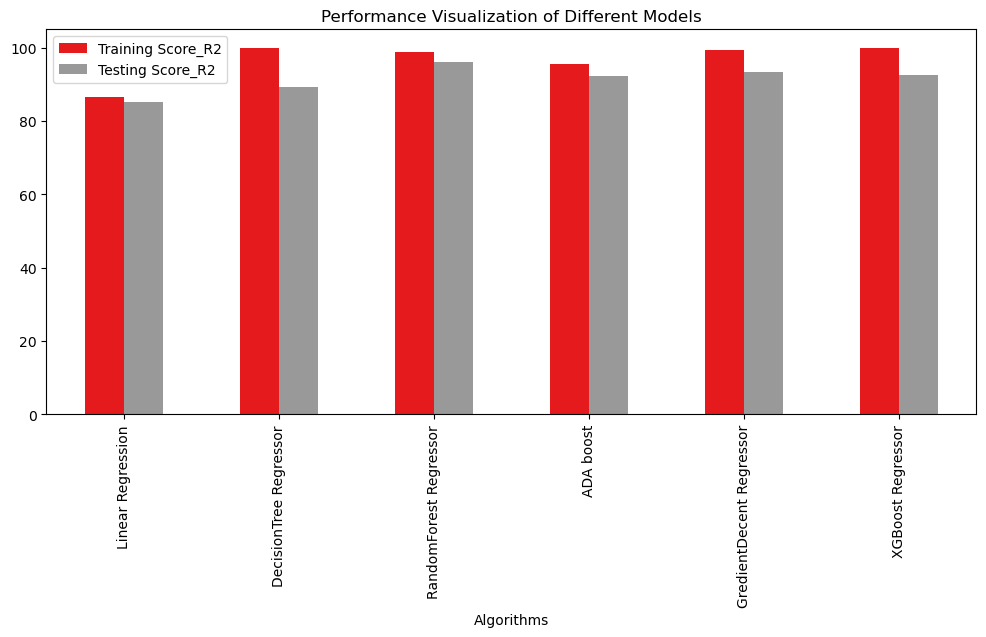

In [363]:
Results_Dataframe.plot(x="Algorithms",y=["Training Score_R2","Testing Score_R2"], figsize=(12,5),kind="bar",
        title="Performance Visualization of Different Models",colormap="Set1")
plt.show()


### In summary, this project demonstrates the power of machine learning in predicting car prices accurately. Our model, particularly GradientBoostingRegressor, achieved remarkable results, suggesting its potential value to businesses in the automotive industry. By leveraging this model, companies can gain a competitive edge and optimize their pricing strategies for greater profitability.